<a href="https://colab.research.google.com/github/Yagwar/Proyectos/blob/master/Linkdin_contacts.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import random
import time
%matplotlib inline
import matplotlib.animation as animation
matplotlib.style.use('seaborn')

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.decomposition import PCA
from sklearn import manifold
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster import hierarchy
from sklearn.cluster import DBSCAN
from sklearn.metrics.pairwise import pairwise_distances
from wordcloud import WordCloud
from sklearn.neighbors import kneighbors_graph

from mpl_toolkits.mplot3d import Axes3D
import pickle
clrs_7=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#a65628'])#'#d9d9d9',

In [2]:
from google.colab import drive
drive.mount('/content/gdrive')
files_route="gdrive/My Drive/Freelancer/linkedin contacts/"

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [0]:
start_exec=time.time()

In [4]:
dat=pd.read_csv(files_route+"Connections.csv")
print(dat.columns)
dat["Connected On"]=pd.to_datetime(dat["Connected On"])

Index(['First Name', 'Last Name', 'Email Address', 'Company', 'Position',
       'Connected On'],
      dtype='object')


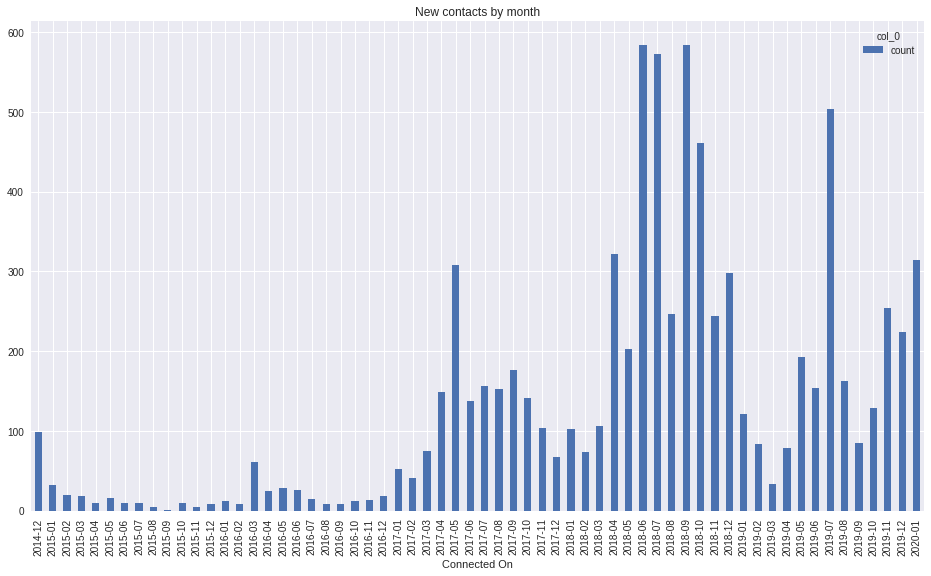

In [67]:
contact_date = pd.crosstab(index=dat["Connected On"].dt.to_period('m'),
                           columns="count")
contact_date.plot(kind="bar",figsize=(16,9), title="New contacts by month")#, cmap=clrs_7)

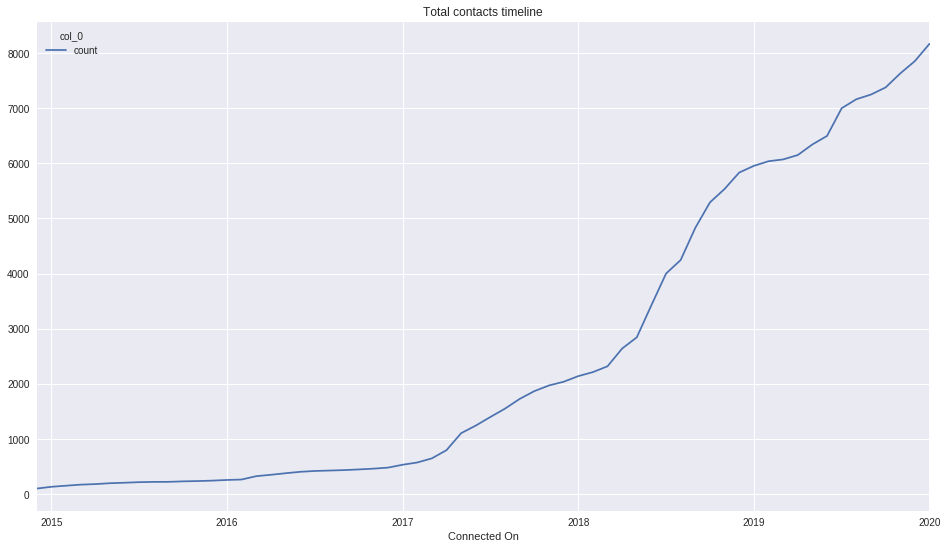

In [6]:
contact_date.cumsum().plot(figsize=(16,9),title="Total contacts timeline")#,cmap=clrs_7)
# plt.yscale('log')

In [0]:
dat["Description"]=dat["Company"]+" "+dat["Position"]

In [8]:
### Non Company Description Accounts
print("Proportion of Non Company Description Accounts: ", sum(pd.isna(dat["Description"]))/len(pd.isna(dat["Description"])))
data=dat.dropna(subset=["Description"])#(how='any')
print("Filtered Contacts", len(pd.isna(data["Description"])))
#dat.iloc(pd.isna(dat["Description"]))
data.shape

Proportion of Non Company Description Accounts:  0.0401468788249694
Filtered Contacts 7842


(7842, 7)

In [9]:
data.shape

(7842, 7)

## preprocessing

In [0]:
stp_wrds=['de','en','del','la','las','sas','inc','in','of','the','el','los','ltda','com','ltd','and','llc',
     'para','san','sa','co','con','for','it','esp','eps','corp','at','av','sm','cia']

In [11]:
count_vect = CountVectorizer(stop_words=stp_wrds)#,ngram_range=(1,2))
n_grams_counts = count_vect.fit_transform(data["Description"])#.toarray()
n_grams_counts.shape
#count_vect.get_feature_names()

(7842, 8757)

In [12]:
#np.array([n_grams_counts.toarray().sum(axis=0),count_vect.get_feature_names()])
top_n = 300
txt_freqs= n_grams_counts.toarray().sum(axis=0)
indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
features =count_vect.get_feature_names()# vectorizer.get_feature_names()
# top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
print (np.array(top_features[:50]))

[['data' '986']
 ['scientist' '542']
 ['analista' '504']
 ['colombia' '485']
 ['senior' '441']
 ['director' '422']
 ['manager' '408']
 ['universidad' '367']
 ['engineer' '336']
 ['gerente' '306']
 ['analyst' '258']
 ['business' '254']
 ['analytics' '237']
 ['consultant' '221']
 ['profesional' '205']
 ['software' '191']
 ['learning' '187']
 ['nacional' '187']
 ['jefe' '181']
 ['banco' '180']
 ['consultor' '177']
 ['selección' '177']
 ['research' '169']
 ['founder' '168']
 ['talento' '168']
 ['group' '167']
 ['science' '165']
 ['gestión' '162']
 ['docente' '161']
 ['desarrollo' '160']
 ['ceo' '157']
 ['talent' '152']
 ['grupo' '147']
 ['machine' '143']
 ['digital' '142']
 ['developer' '140']
 ['humano' '140']
 ['lead' '136']
 ['coordinador' '135']
 ['comercial' '129']
 ['ai' '125']
 ['psicóloga' '124']
 ['seguros' '122']
 ['head' '119']
 ['marketing' '117']
 ['coordinadora' '115']
 ['intelligence' '112']
 ['humana' '112']
 ['specialist' '110']
 ['universitaria' '110']]


### Diccionario de normalización de términos

In [13]:
esp_words=[ 'universidad', 'nacional', 'banco', 'grupo', 'universitaria', 'fundación', 'seguros',
 'independiente', 'salud', 'corporación', 'centro', 'instituto', 'servicios', 'colegio',
 'consultores', 'pontificia', 'oficial', 'distrital', 'andina', 'educación', 'secretaria',
 'agencia', 'colombiana', 'católica', 'escuela', 'departamento',
 'humano', 'secretaría', 'soluciones', 'estadística',
 'organización', 'clínica', 'ministerio', 'seguridad', 'desarrollo', 'empresarial', 'fundacion', 'fundación',
 'integral', 'internacional', 'administrativo', 'casa', 'editorial', 'minuto',
 'talento', 'valle', 'universidade', 'consultoría', 'ingeniería', 'santo', 'gimnasio',
 'comercializadora', 'colombiano', 'servicio',
 'ejercito', 'investigación', 'tiempo', 'vida', 'alcaldia', 'fondo', 'bienestar',
 'inversiones', 'caja', 'consultoria', 'rosario', 'occidente', 'financiera', 'alianza', 'clinica',
 'asociados', 'nivel', 'bosque', 'corredores', 'tecnología',
 'psicología','psicologia', 'generales', 'hogar', 'estudios', 'comercial',
 'compañía', 'latinoamericana', 'particular', 'empleo', 'comercio', 'professional',
 'digital', 'alcaldía', 'unidad', 'ventas', 'financieros', 'empresa', 'gestión', 'industria',
 'industriales', 'empresariales', 'pedagógica', 'república', 'norte', 'consultora',
 'mercantil', 'asociación', 'comunicaciones', 'asesorías',
 'consultor', 'terciarios', 'área', 'integración', 'artificial', 'cooperativa',
 'transportes','freelance','freelancer','consultant', 'datos',
 'analista','análisis','gerente','profesional','selección','seleccion','humanos',
 'psicólogo','psicóloga','psicologo','psicologa','psychologist','directora',
 'estadístico','estadística','estadistico','analyst','científico','científica','ciencia',
 'operaciones','riesgo', 'procesos','desarrollador', 'mercadeo','profesor','profesora', 'docente',
 'cátedra','catedrático','catedrática','analítica','ventas'] 

eng_words=['university', 'national', 'bank', 'group', 'university', 'foundation', 'insurance',
 'independent', 'health', 'corporation', 'center', 'institute', 'services', 'school',
 'consultancy', 'pontifical', 'official', 'district', 'andean', 'education', 'secretary',
 'agency', 'colombian', 'catholic', 'school', 'department',
 'human', 'secretary', 'solutions', 'statistics',
 'organization', 'clinic', 'ministry', 'security', 'development', 'business', 'foundation', 'foundation',
 'integral', 'international', 'administrative', 'house', 'editorial', 'minute',
 'talent', 'valley', 'university', 'consulting', 'engineering', 'saint', 'gym',
 'sales', 'colombian', 'servicio',
 'army', 'research', 'time', 'life', 'mayor', 'fund', 'wellness',
 'investments', 'box', 'consultancy', 'rosary', 'occident', 'financial', 'alliance', 'clinic',
 'associates', 'level', 'forest', 'broker', 'technology',
 'psychology','psychology', 'generals', 'home', 'studies', 'commercial',
 'company', 'latam', 'private', 'employment', 'commerce', 'professional',
 'digital', 'mayor', 'unit', 'sales', 'financial', 'company', 'management', 'industry',
 'industry', 'business', 'pedagogical', 'republic', 'north', 'consultancy',
 'mercantile', 'association', 'communications', 'consultancy',
 'consultancy', 'tertiary', 'area', 'integration', 'artificial', 'cooperative',
 'transport','consultancy','consultancy','consultancy','data',
 'analysis','analysis','manager','professional','selection','selection','human',
 'psychology','psychology','psychology','psychology','psychology','director',
 'statistics','statistics','statistics','analysis','scientist','scientist','science',
 'operations','risk','process','developer','marketing','professor','professor','professor',
 'professor','professor','professor','analytics','sales']
len(esp_words)==len(eng_words)

True

In [14]:
print("START lower case and unify most frequent words languaje")
for i in data.Description.index:
    jb_desc=str(data.Description[i]).lower()
    for n_wd in range (len (esp_words)):
        jb_desc = jb_desc.replace(esp_words[n_wd], eng_words[n_wd])
    data.Description[i]=jb_desc
#     print(i)
print("END")

START lower case and unify most frequent words languaje


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.6/dist-packages/IPython/core/interactiveshell.py:2882: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  exec(code_obj, self.user_global_ns, self.user_ns)


END


In [15]:
# Repeat vectorization after replacement frequent terms
count_vect = CountVectorizer(stop_words=stp_wrds)#,ngram_range=(1,2))
n_grams_counts = count_vect.fit_transform(data["Description"])#.toarray()
n_grams_counts.shape
#count_vect.get_feature_names()

(7842, 8613)

In [0]:
# data.sample(25)

In [17]:
top_n = 300
txt_freqs= n_grams_counts.toarray().sum(axis=0)
indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
features =count_vect.get_feature_names()# vectorizer.get_feature_names()
# top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
print (np.array(top_features[:50]))

[['data' '1094']
 ['analysis' '801']
 ['manager' '714']
 ['consultancy' '632']
 ['scientist' '589']
 ['university' '574']
 ['director' '529']
 ['colombia' '485']
 ['senior' '441']
 ['psychology' '405']
 ['engineer' '336']
 ['talent' '320']
 ['group' '314']
 ['professor' '302']
 ['business' '296']
 ['analytics' '281']
 ['development' '254']
 ['management' '246']
 ['research' '241']
 ['professional' '233']
 ['selection' '216']
 ['human' '215']
 ['national' '206']
 ['bank' '199']
 ['software' '191']
 ['learning' '187']
 ['jefe' '181']
 ['science' '172']
 ['founder' '168']
 ['developer' '162']
 ['ceo' '157']
 ['marketing' '150']
 ['services' '148']
 ['insurance' '147']
 ['machine' '143']
 ['digital' '142']
 ['commercial' '140']
 ['statistics' '139']
 ['lead' '136']
 ['coordinador' '135']
 ['foundation' '134']
 ['ai' '125']
 ['international' '122']
 ['consulting' '122']
 ['solutions' '121']
 ['head' '119']
 ['coordinadora' '115']
 ['humana' '112']
 ['intelligence' '112']
 ['independent' '11

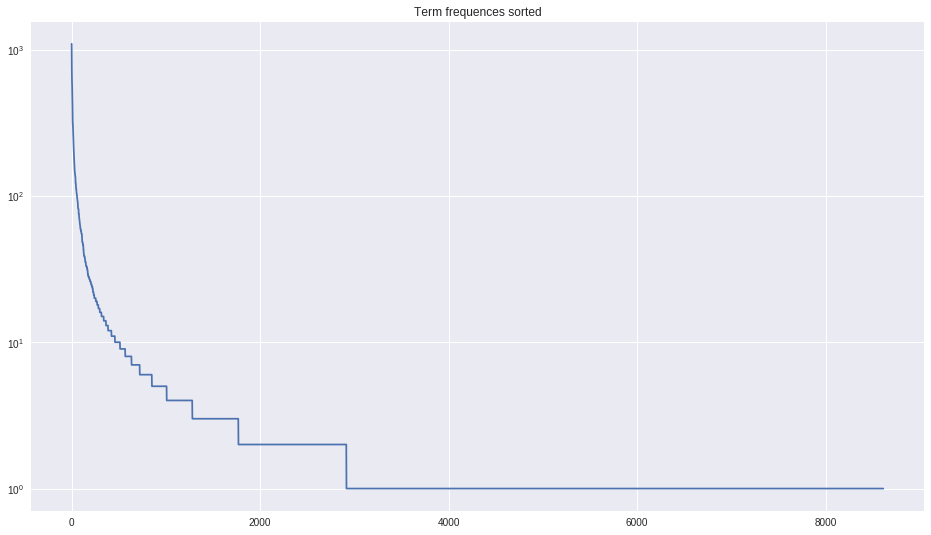

In [18]:
plt.figure(figsize=(16,9))
plt.plot(txt_freqs[indices])
plt.title("Term frequences sorted")
#txt_freqs[indices[:top_n]]
plt.yscale('log')

Text(0.5, 1.0, 'Terms count by profile')

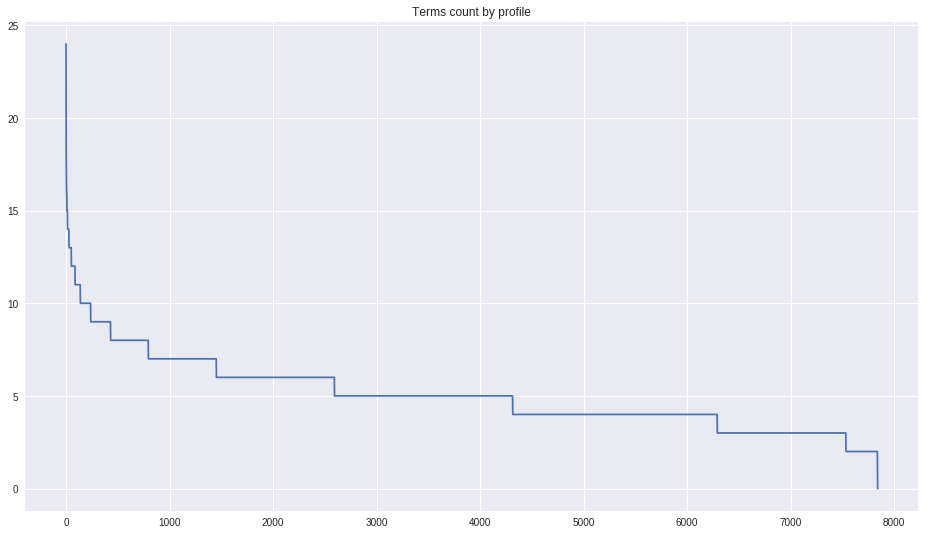

In [19]:
cntc_freqs= n_grams_counts.toarray().sum(axis=1)
cntc_indices = np.argsort(cntc_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
plt.figure(figsize=(16,9))
plt.plot(cntc_freqs[cntc_indices])
plt.title("Terms count by profile")
#txt_freqs[indices[:top_n]]
# plt.yscale('log')

col_0  count
row_0       
0          2
1          1
2        305
3       1243
4       1976
5       1722
6       1141
7        657
8        365
9        192
10       100
11        51
12        36
13        23
14        14
15         6
16         3
17         2
18         1
20         1
24         1


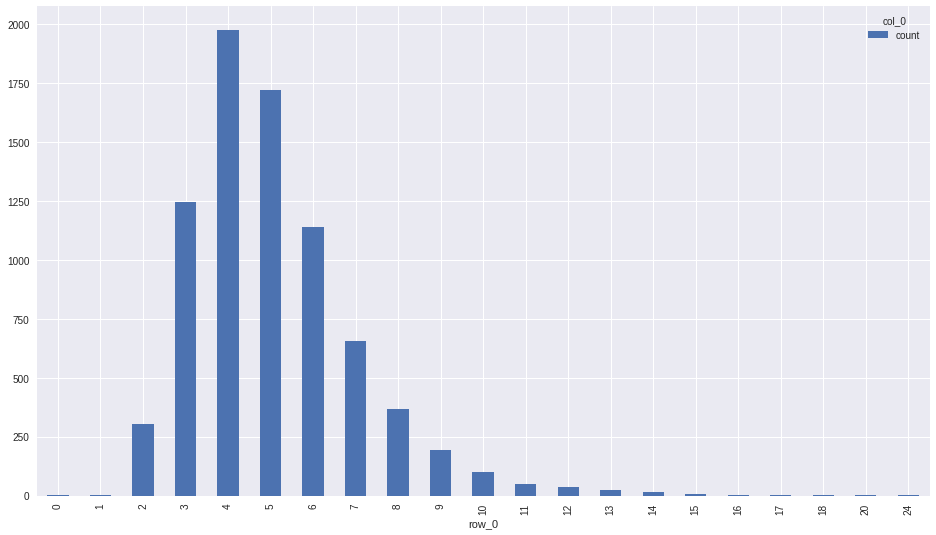

In [20]:
print(pd.crosstab(index=cntc_freqs, columns="count"))
pd.crosstab(index=cntc_freqs, columns="count").plot(kind="bar",figsize=(16,9))#/3409
#(cntc_freqs)

In [21]:
tfidf_transformer = TfidfVectorizer(stop_words=stp_wrds)
n_grams_tfidf = tfidf_transformer.fit_transform(data["Description"])
n_grams_tfidf.shape

(7842, 8613)

Text(0.5, 1.05, 'Term-frequence matrix')

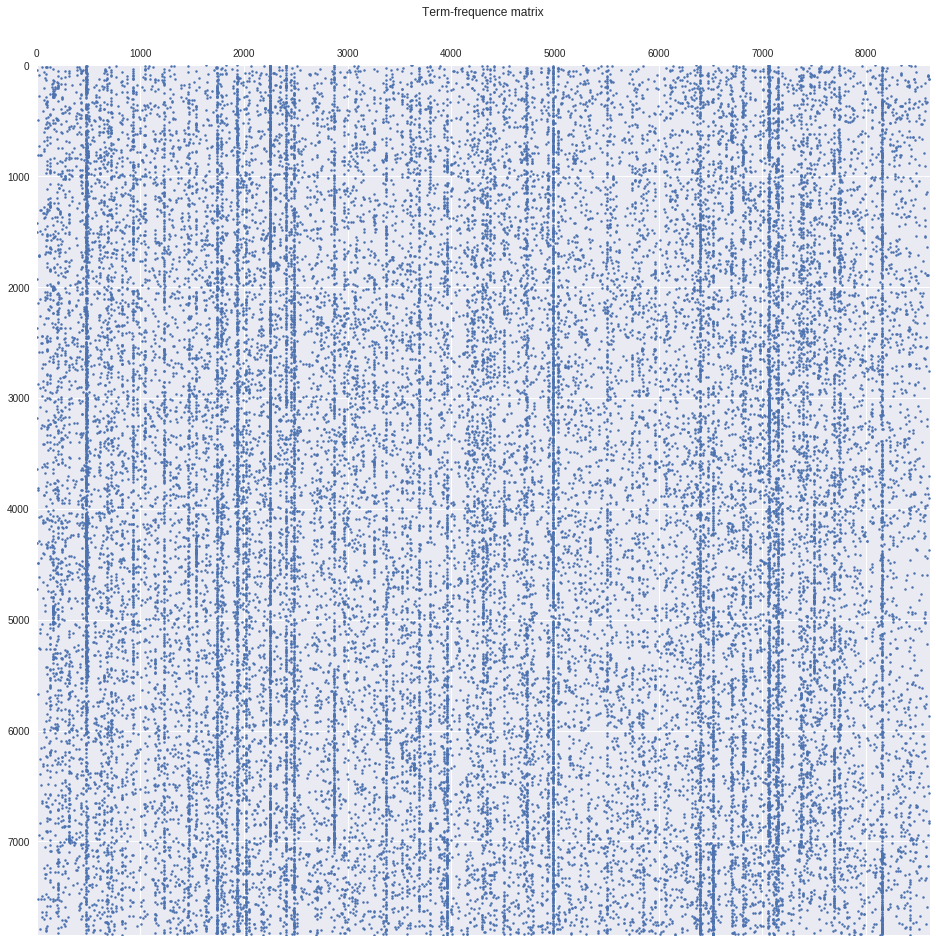

In [22]:
plt.figure(figsize=(16,16))
plt.spy(n_grams_counts,markersize=2.5, marker="o",aspect='auto')
plt.title("Term-frequence matrix")

In [0]:
# plt.figure(figsize=(16,16))
# plt.spy(n_grams_tfidf,markersize=2.5, marker="o",aspect='auto')#,markersize=3
# plt.title("tf-idf matrix")

/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2534: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[:, None]
/usr/local/lib/python3.6/dist-packages/numpy/lib/function_base.py:2535: RuntimeWarning: invalid value encountered in true_divide
  c /= stddev[None, :]


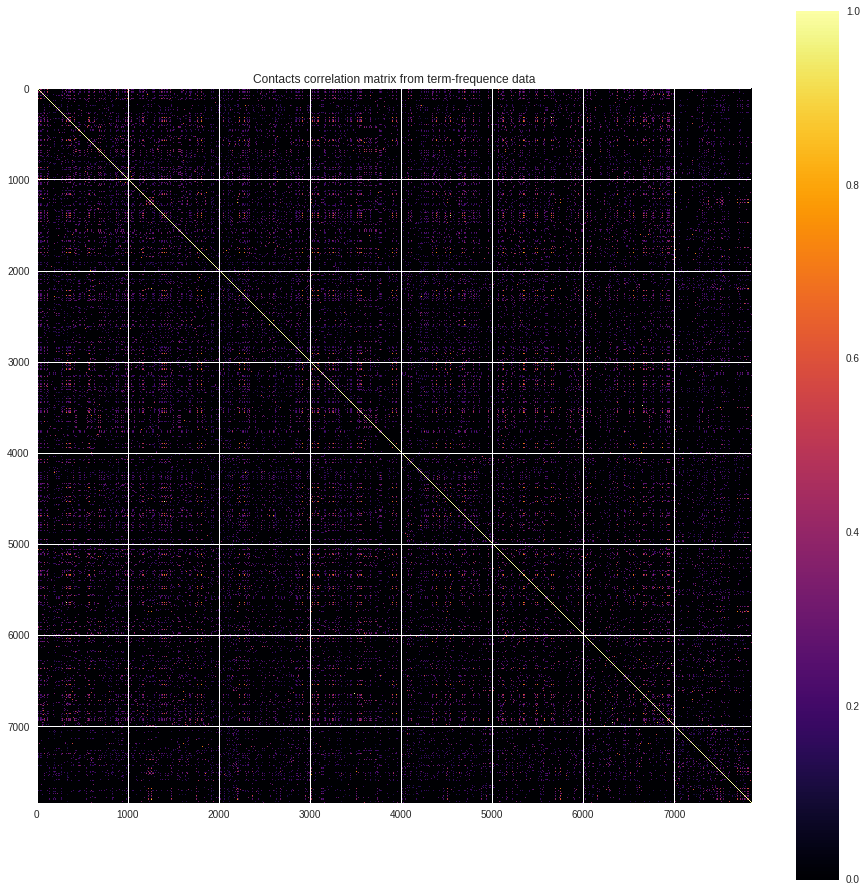

In [24]:
plt.figure(figsize=(16,16))
plt.imshow(np.corrcoef(n_grams_counts.toarray()), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from term-frequence data")
plt.colorbar()
plt.show()


## 3 dimentions spectral embedding Ward and DB-scan culstering

In [0]:
# 30d Embedding for clustering
spect_emb_tfidf_30=manifold.SpectralEmbedding(n_components=30, n_jobs=-1).fit_transform(n_grams_counts.toarray())

In [0]:
# 3d Embedding for visualization
spect_emb_tfidf_3=manifold.SpectralEmbedding(n_components=3, n_jobs=-1).fit_transform(n_grams_counts.toarray())#spect_emb_tfidf_30)

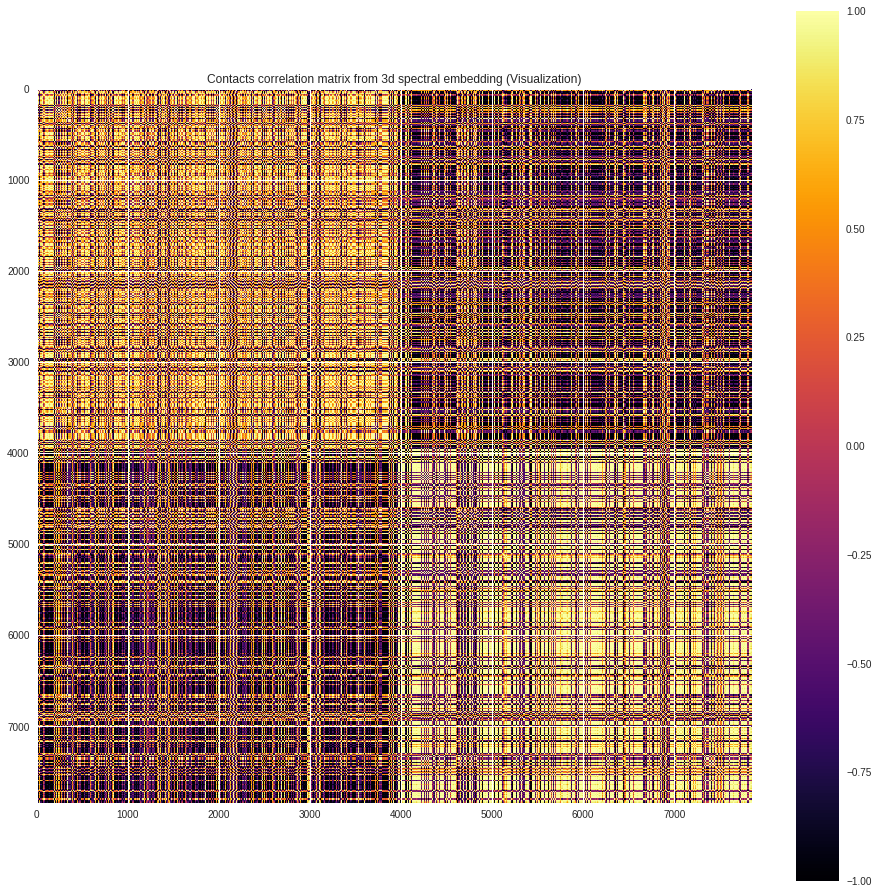

In [27]:
plt.figure(figsize=(16,16))
plt.imshow(np.corrcoef(spect_emb_tfidf_3), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from 3d spectral embedding (Visualization)")
plt.colorbar()
plt.show()

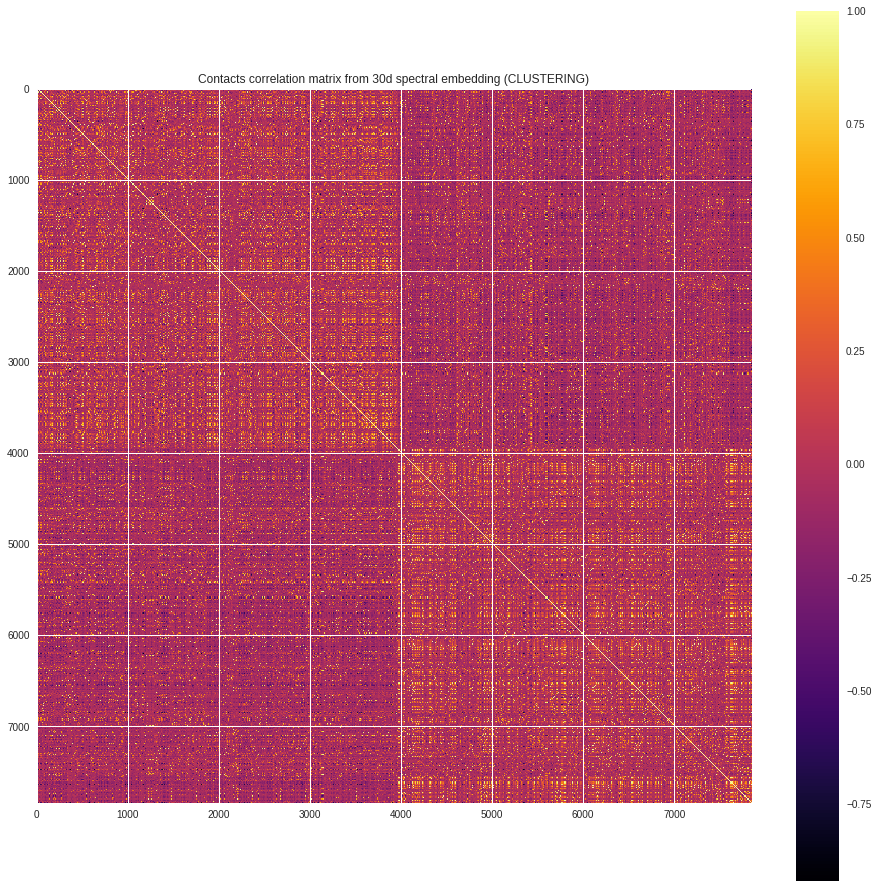

In [28]:
plt.figure(figsize=(16,16))
# plt.imshow(np.corrcoef(spect_emb_tfidf_12d), cmap=plt.cm.inferno, interpolation='nearest')
plt.imshow(np.corrcoef(spect_emb_tfidf_30), cmap=plt.cm.inferno, interpolation='nearest')
plt.title("Contacts correlation matrix from 30d spectral embedding (CLUSTERING)")
plt.colorbar()
plt.show()

In [0]:
contacts_ward_30d=hierarchy.linkage(spect_emb_tfidf_30, 'ward')

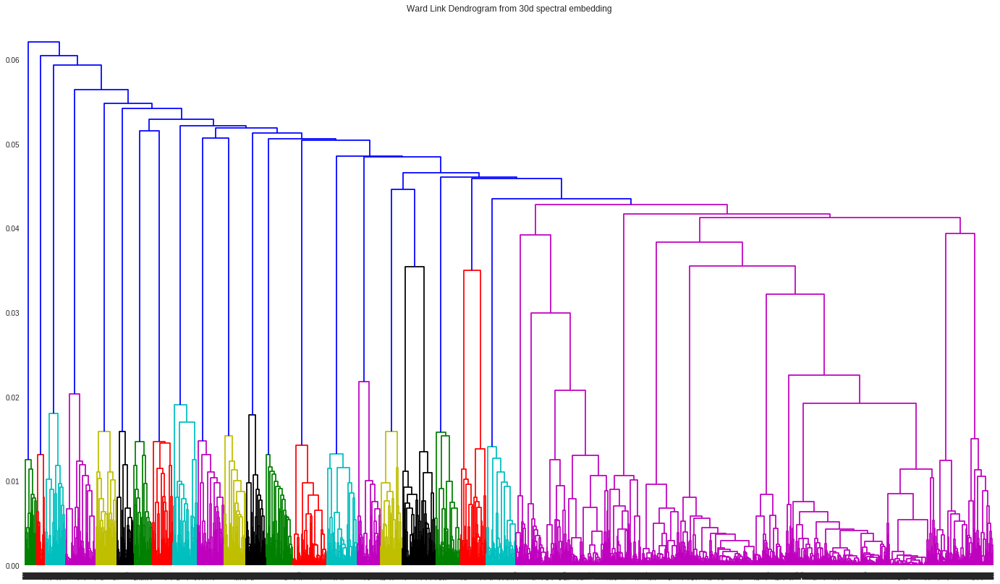

In [30]:
plt.figure(figsize=(24,14))
dn_tf = hierarchy.dendrogram(contacts_ward_30d)#,orientation="left")
plt.title('Ward Link Dendrogram from 30d spectral embedding')
plt.show()

In [0]:
connectivity = kneighbors_graph(spect_emb_tfidf_30, n_neighbors=15, include_self=False)

In [32]:
clustering_30d_ward = AgglomerativeClustering(linkage='ward', n_clusters=20,connectivity=connectivity)
# clustering_12d_ward.fit(spect_emb_tfidf_12d)
clustering_30d_ward.fit(spect_emb_tfidf_30)
# clustering.fit(n_grams_tfidf.toarray())

/usr/local/lib/python3.6/dist-packages/sklearn/cluster/_agglomerative.py:245: UserWarning: the number of connected components of the connectivity matrix is 3 > 1. Completing it to avoid stopping the tree early.
  affinity='euclidean')


AgglomerativeClustering(affinity='euclidean', compute_full_tree='auto',
                        connectivity=<7842x7842 sparse matrix of type '<class 'numpy.float64'>'
	with 117630 stored elements in Compressed Sparse Row format>,
                        distance_threshold=None, linkage='ward', memory=None,
                        n_clusters=20)

In [33]:
pd.crosstab(index=clustering_30d_ward.labels_, columns="count")

col_0,count
row_0,
0,4323
1,266
2,160
3,212
4,164
5,150
6,167
7,244
8,182


In [0]:
spect_emb_tfidf_3=spect_emb_tfidf_3*1000

Text(0.5, 1.0, '2d spectral coordinates from 12d spectral hierarchical (ward) clustering')

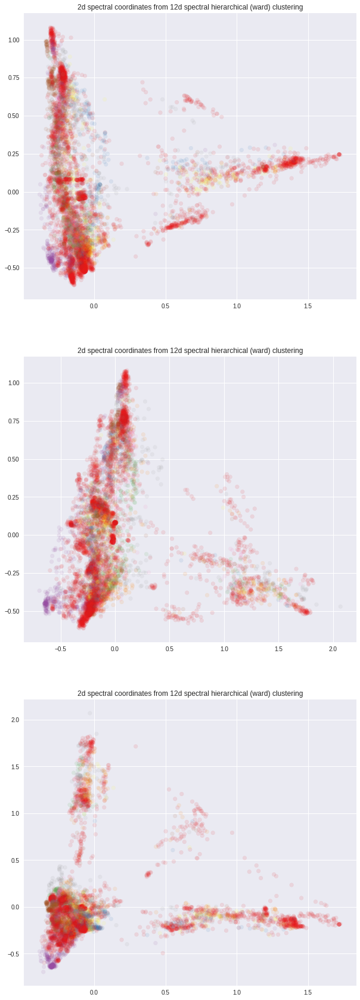

In [35]:
plt.figure(figsize=(10,30))
par_alf=0.1
plt.subplot(311)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,1], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 12d spectral hierarchical (ward) clustering")

plt.subplot(312)
plt.scatter(spect_emb_tfidf_3[:,2],spect_emb_tfidf_3[:,1], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 12d spectral hierarchical (ward) clustering")

plt.subplot(313)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,2], alpha=par_alf,s=45, c=clustering_30d_ward.labels_, cmap=plt.cm.Set1)
plt.title("2d spectral coordinates from 12d spectral hierarchical (ward) clustering")

Text(0.5, 0.92, "Ward's hierarchical clustering from spectral embedding ")

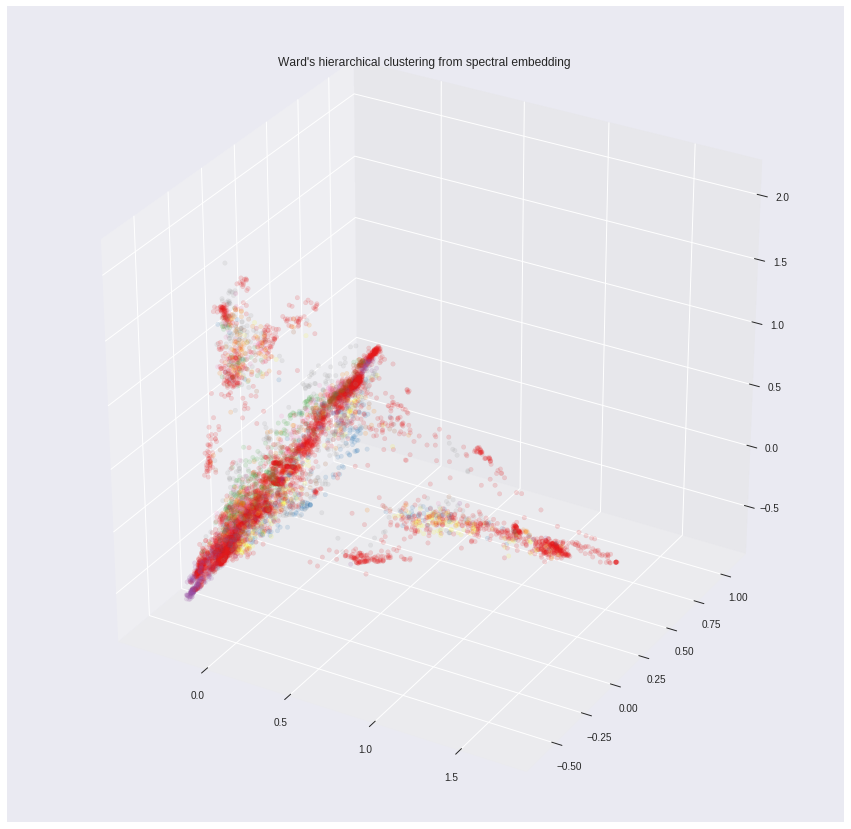

In [36]:
 fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=spect_emb_tfidf_3[:,0],
           ys=spect_emb_tfidf_3[:,1],
           zs=spect_emb_tfidf_3[:,2],
           c=clustering_30d_ward.labels_, 
           alpha=0.15,
           cmap=plt.cm.Set1)
plt.title("Ward's hierarchical clustering from spectral embedding ")

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Making animation


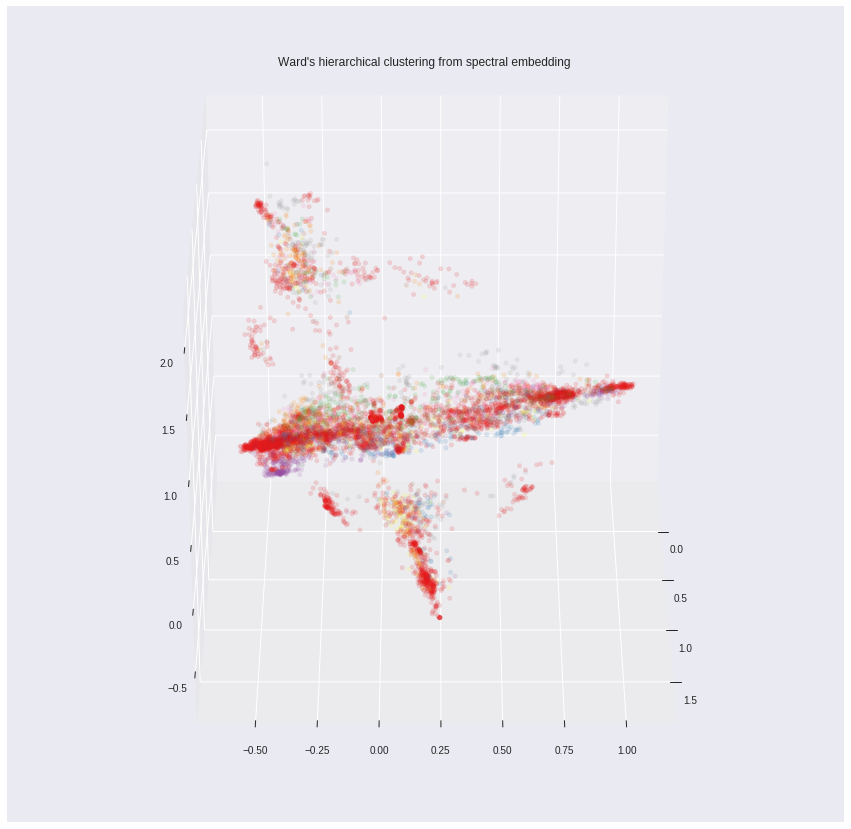

In [37]:
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=spect_emb_tfidf_3[:,0],
           ys=spect_emb_tfidf_3[:,1],
           zs=spect_emb_tfidf_3[:,2],
           c=clustering_30d_ward.labels_, 
           alpha=0.15,
           cmap=plt.cm.Set1)
plt.title("Ward's hierarchical clustering from spectral embedding ")
# plt.axis('off') #remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)
print("Making animation")
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
rot_animation.save(files_route+'ward_clusters_axis.gif', dpi=80, writer='imagemagick')

In [0]:
dist_mat_30d=pairwise_distances(spect_emb_tfidf_30)

In [0]:
dist_vec=dist_mat_30d.flatten()

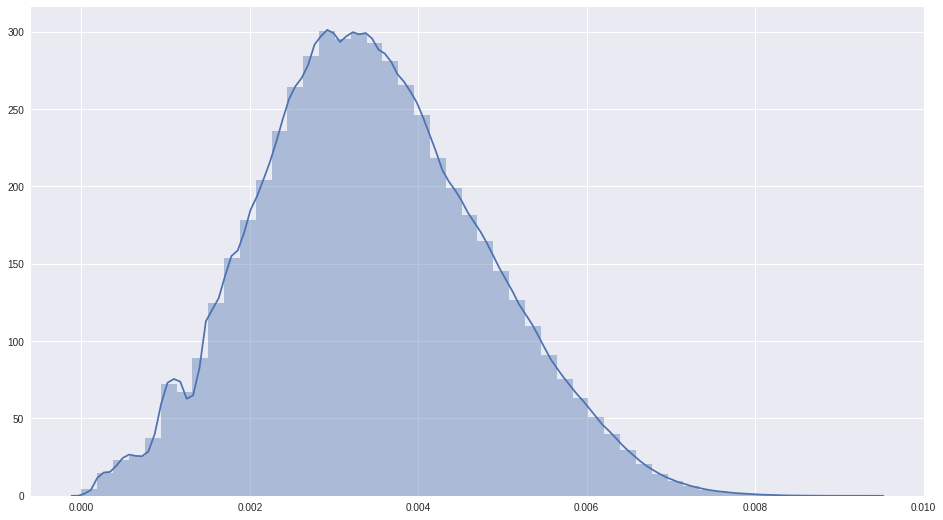

In [40]:
plt.figure(figsize=(16,9))
# plt.hist(n_grams_tfidf_dist_mat.flatten())
sns.distplot(dist_vec)
# sns.kdeplot()

In [0]:
freq_dists=pd.crosstab(index=np.round_(dist_vec,6), columns="count")

col_0     count
row_0          
0.000000   7852
0.000001      2
0.000003      4
0.000004      2
0.000006      6
...         ...
0.000147    402
0.000148    398
0.000149    394
0.000150    422
0.000151    490

[150 rows x 1 columns]


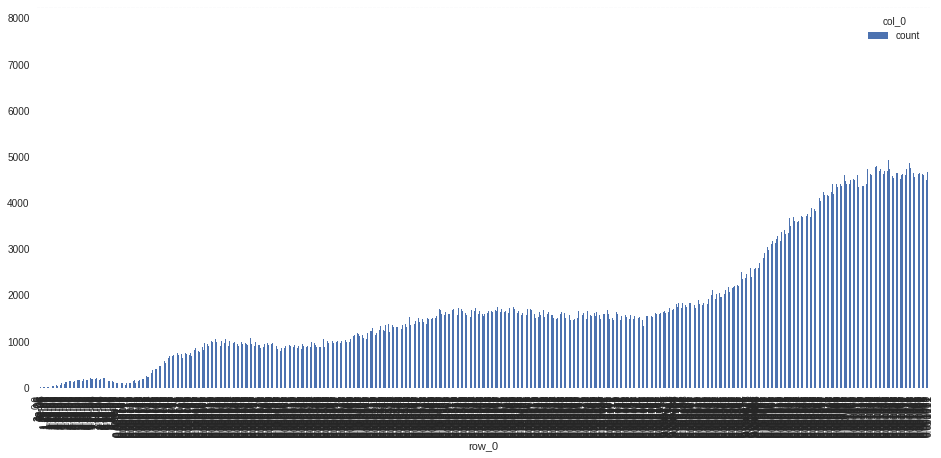

In [82]:
print(freq_dists.iloc[:150,:])#.iloc[:50,:])
freq_dists.iloc[:1100,:].plot(kind="bar",figsize=(16,7))#.iloc[:150,:]

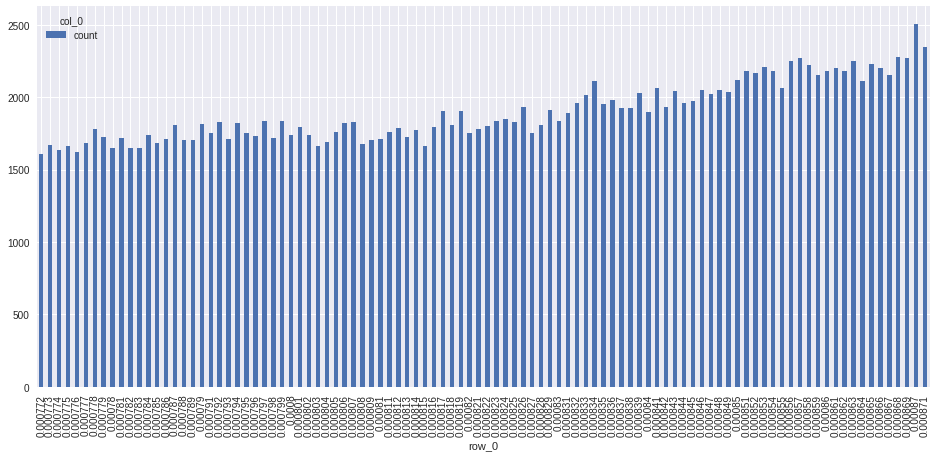

In [125]:
freq_dists.iloc[770:870,:].plot(kind="bar",figsize=(16,7))#.iloc[:150,:]

col_0,count
row_0,
-1,4558
0,2594
1,175
2,66
3,194
4,202
5,53


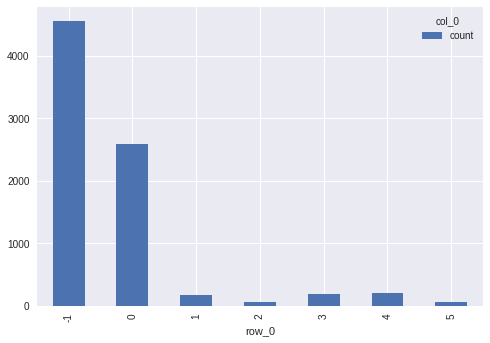

In [128]:
db_scan = DBSCAN(eps=.000818, min_samples=50).fit(spect_emb_tfidf_30)#spect_emb_tfidf).000842#.000875#.000301
spect_db_labels = db_scan.labels_
pd.crosstab(index=spect_db_labels, columns="count").plot(kind="bar")
pd.crosstab(index=spect_db_labels, columns="count")

In [0]:
clustering_colors=matplotlib.colors.LinearSegmentedColormap.from_list("", ['#d9d9d9','#e41a1c','#377eb8','#4daf4a','#984ea3','#ff7f00','#a65628'])#

array([-1,  0, -1, ..., -1,  0,  0])

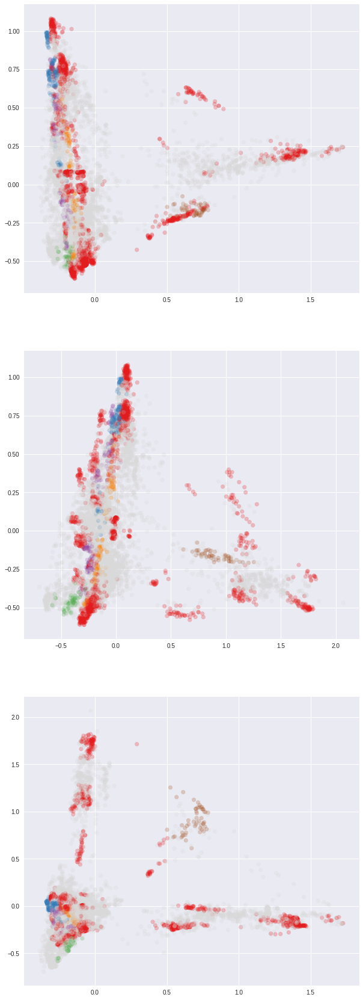

In [130]:
plt.figure(figsize=(10,30))
par_alf=0.15

plt.subplot(311)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,1], alpha=0.25,s=45, c=spect_db_labels, cmap=clustering_colors)#plt.cm.tab10)

plt.subplot(312)
plt.scatter(spect_emb_tfidf_3[:,2],spect_emb_tfidf_3[:,1], alpha=0.25,s=45, c=spect_db_labels, cmap=clustering_colors)#plt.cm.tab10)plt.title("2d spectral coordinates from 12d spectral hierarchical (ward) clustering")

plt.subplot(313)
plt.scatter(spect_emb_tfidf_3[:,0],spect_emb_tfidf_3[:,2], alpha=0.25,s=45, c=spect_db_labels, cmap=clustering_colors)#plt.cm.tab10)

spect_db_labels

Text(0.5, 0.92, 'DBScan clustering from spectral embedding')

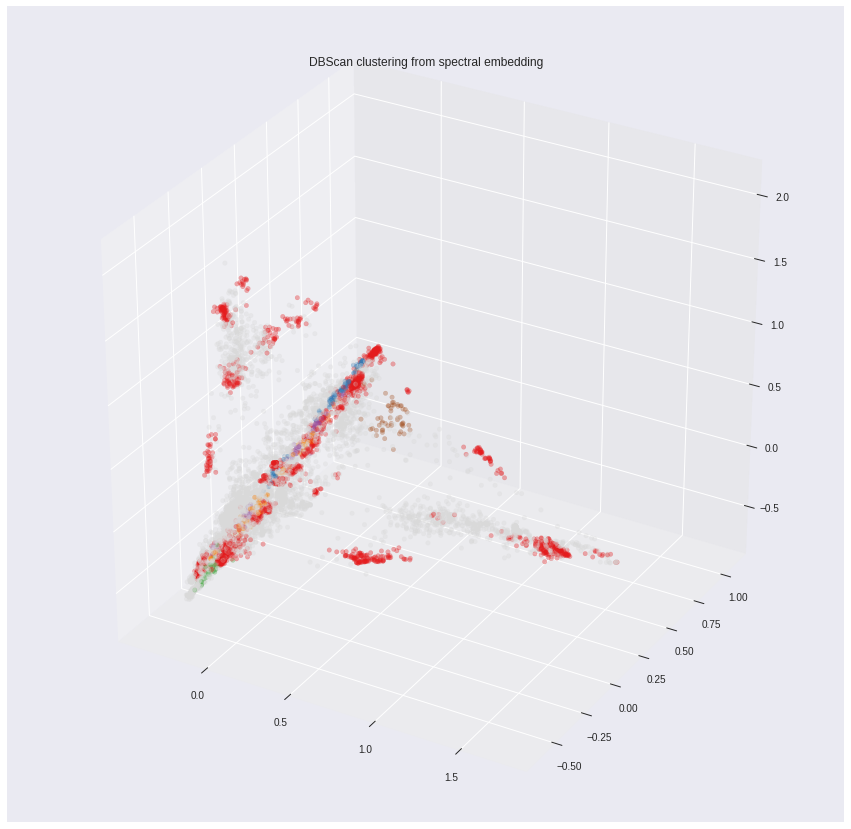

In [131]:
# https://stackoverflow.com/questions/51457738/animating-a-3d-scatterplot-with-matplotlib-to-gif-ends-up-empty
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=spect_emb_tfidf_3[:,0],
           ys=spect_emb_tfidf_3[:,1],
           zs=spect_emb_tfidf_3[:,2],
           c=spect_db_labels, 
           alpha=0.35,
           cmap=clustering_colors)
plt.title("DBScan clustering from spectral embedding")

MovieWriter imagemagick unavailable; trying to use <class 'matplotlib.animation.PillowWriter'> instead.


Making animation


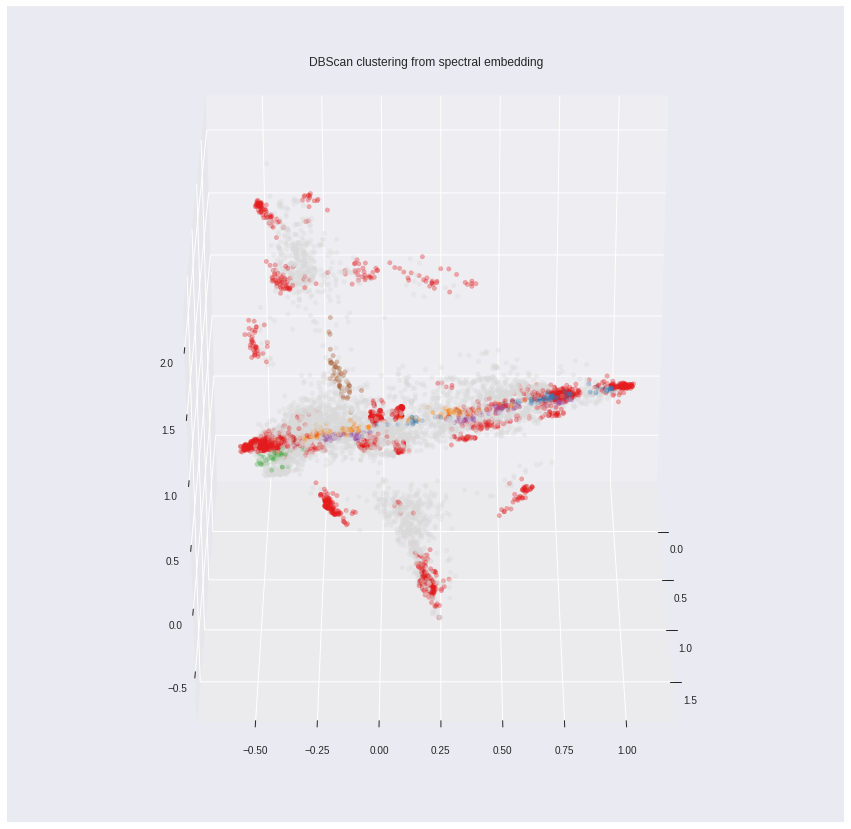

In [132]:
# https://stackoverflow.com/questions/51457738/animating-a-3d-scatterplot-with-matplotlib-to-gif-ends-up-empty
fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(xs=spect_emb_tfidf_3[:,0],
           ys=spect_emb_tfidf_3[:,1],
           zs=spect_emb_tfidf_3[:,2],
           c=spect_db_labels, 
           alpha=0.35,
           cmap=clustering_colors)
plt.title("DBScan clustering from spectral embedding")
# plt.axis('off') # remove axes for visual appeal

def rotate(angle):
    ax.view_init(azim=angle)

print("Making animation")
rot_animation = animation.FuncAnimation(fig, rotate, frames=np.arange(0, 362, 2), interval=100)
rot_animation.save(files_route+'DB_clustering_axis.gif', dpi=80, writer='imagemagick')

# Word Cloud

In [0]:
fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
clrs_wrdcld=matplotlib.colors.LinearSegmentedColormap.from_list("", [#'#a50026',
                                                                     '#d73027',
                                                                     '#f46d43',
                                                                     '#fdae61',
#                                                                      '#fee090',
#                                                                      '#ffffbf',
#                                                                      '#e0f3f8',
#                                                                      '#abd9e9',
                                                                     '#74add1',
                                                                     '#4575b4',
                                                                     '#313695'])

In [134]:
pic_wide=900
wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#plt.cm.Set1_r) #tab10_r)Dark2_r,Paired_r
wc.generate_from_frequencies(fr_dic)

(-0.5, 899.5, 384.5, -0.5)

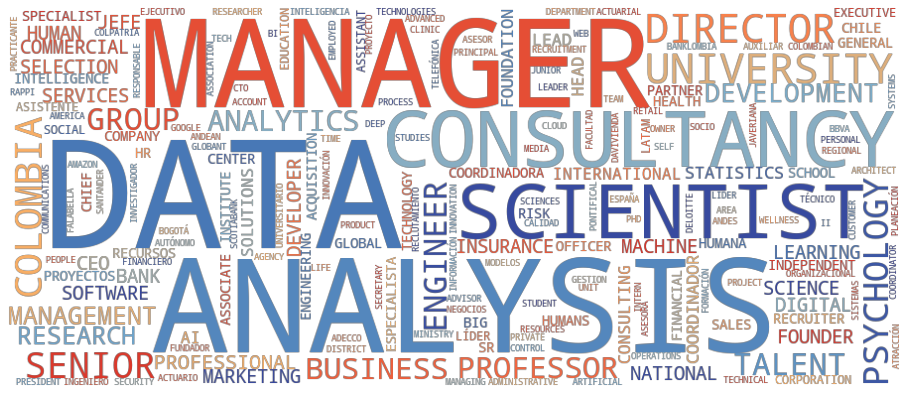

In [135]:
plt.figure(figsize=(16,9))
plt.imshow(wc, interpolation='bilinear')
plt.axis("off")
# plt.savefig('wrdcld.png')

In [136]:
pd.crosstab(index=clustering_30d_ward.labels_, columns=spect_db_labels, margins=True)

col_0,-1,0,1,2,3,4,5,All
row_0,,,,,,,,
0,1231,2577,0,66,194,202,53,4323
1,263,3,0,0,0,0,0,266
2,156,4,0,0,0,0,0,160
3,211,1,0,0,0,0,0,212
4,163,1,0,0,0,0,0,164
5,150,0,0,0,0,0,0,150
6,167,0,0,0,0,0,0,167
7,244,0,0,0,0,0,0,244
8,181,1,0,0,0,0,0,182


## Wordcloud by clusters

In [0]:
def wrd_cld_dic_clust(clust_labels,clust_id,top_n=300,pic_wide=900):
    txt_freqs= n_grams_counts.toarray()[clust_labels==clust_id].sum(axis=0)
    indices = np.argsort(txt_freqs)[::-1]#np.argsort(vectorizer.idf_)[::-1]
    features =count_vect.get_feature_names()# vectorizer.get_feature_names()
    # top_features = [features[i] for i in indices[:top_n]]#[[features[i],txt_freqs[i]] for i in indices[:top_n]]
    top_features = [[features[i],txt_freqs[i]] for i in indices[:top_n]]
    fr_dic={ str(features[i]).upper():txt_freqs[i] for i in indices[:top_n]}
    wc = WordCloud(width=pic_wide,  height=int(pic_wide*(9/21)), 
               background_color=None, mode="RGBA",min_font_size=8,
               colormap=clrs_wrdcld)#plt.cm.Set1_r) #tab10_r)Dark2_r,Paired_r
    wc.generate_from_frequencies(fr_dic)
    return wc


### Wordcloud Ward

(-0.5, 899.5, 384.5, -0.5)

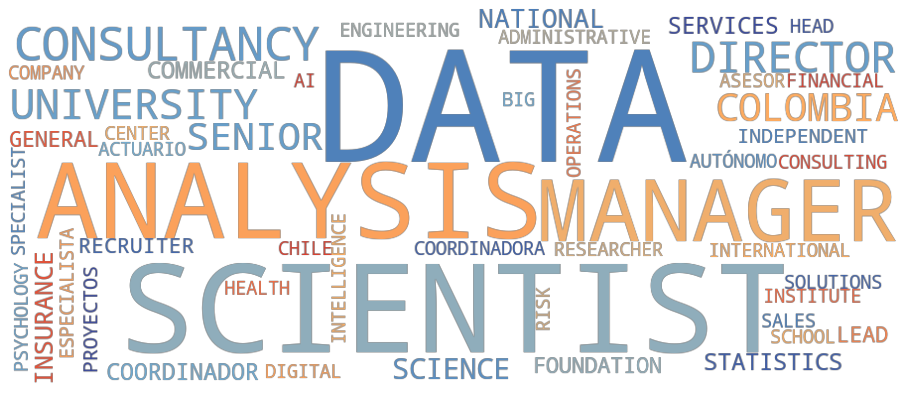

In [54]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,0,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

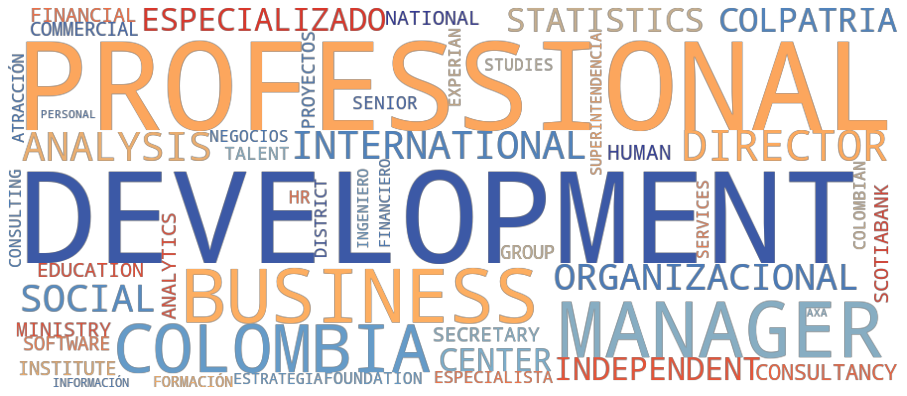

In [55]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

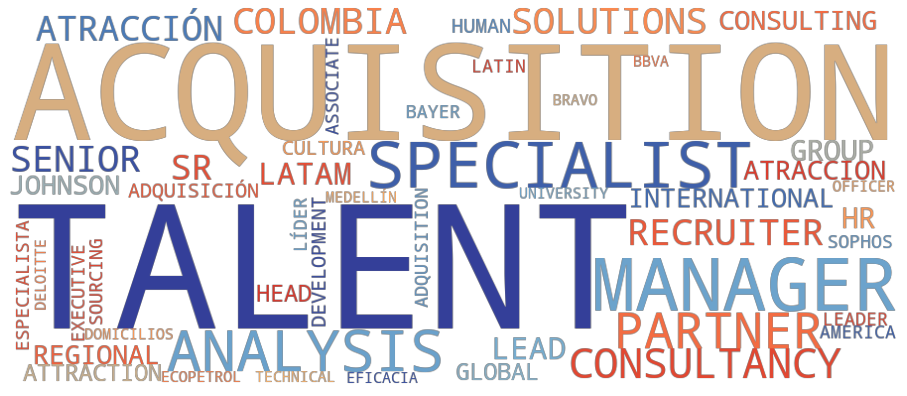

In [56]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,5,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

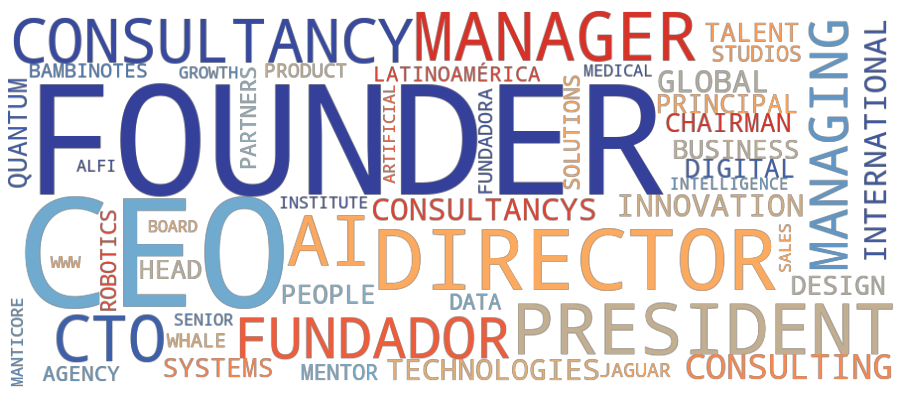

In [57]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,8,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

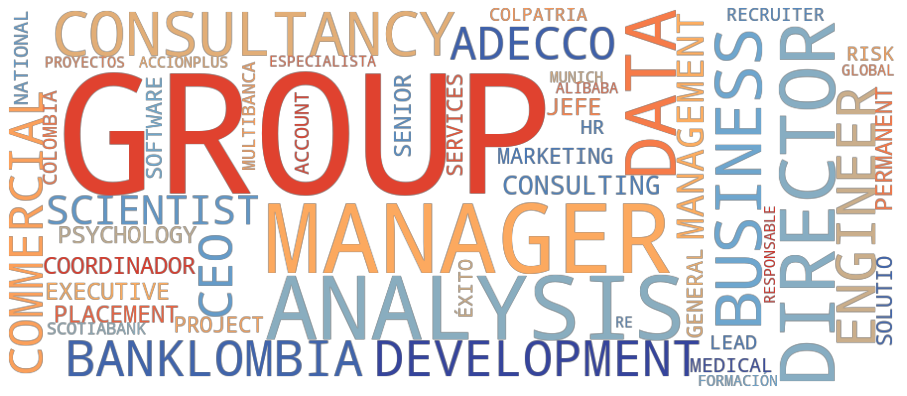

In [58]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,13,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

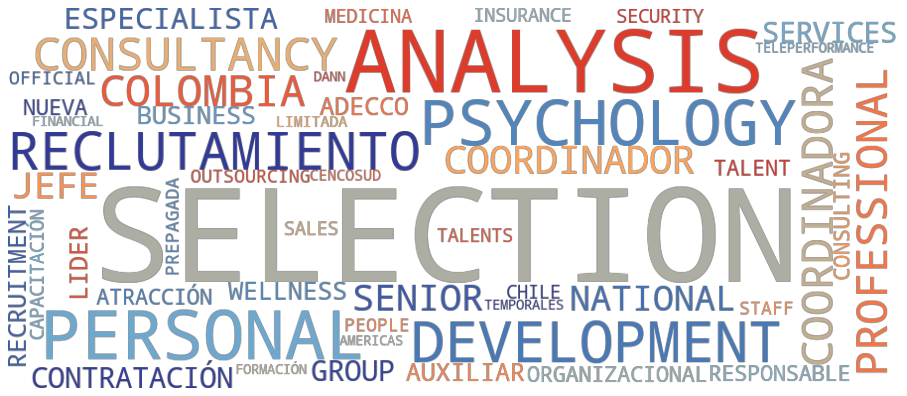

In [59]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,19,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

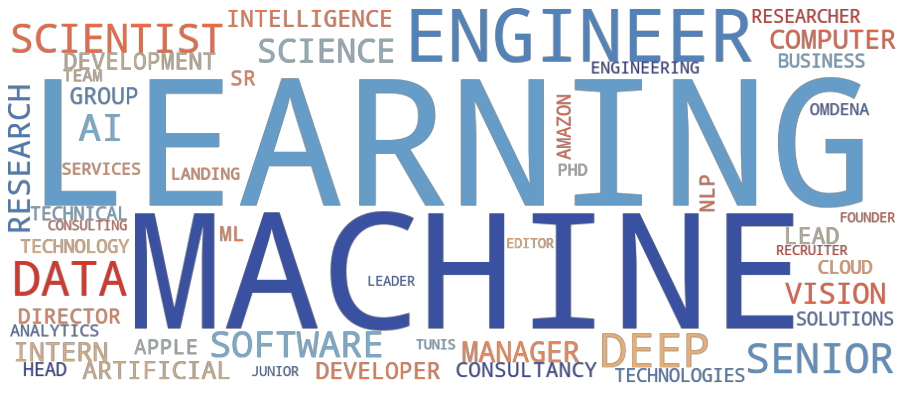

In [60]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(clustering_30d_ward.labels_,4,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

## wordcloud DBScan

(-0.5, 899.5, 384.5, -0.5)

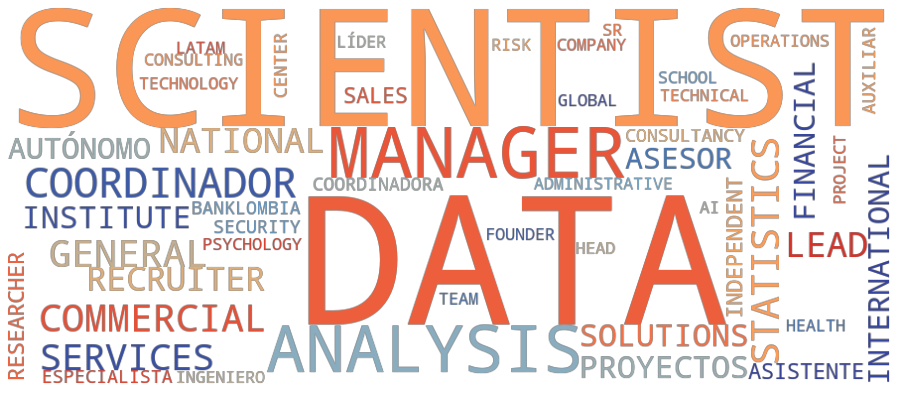

In [137]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,0,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

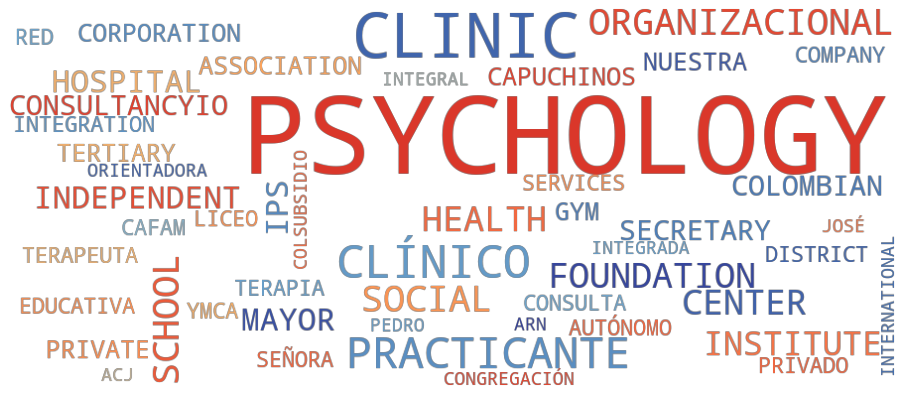

In [138]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

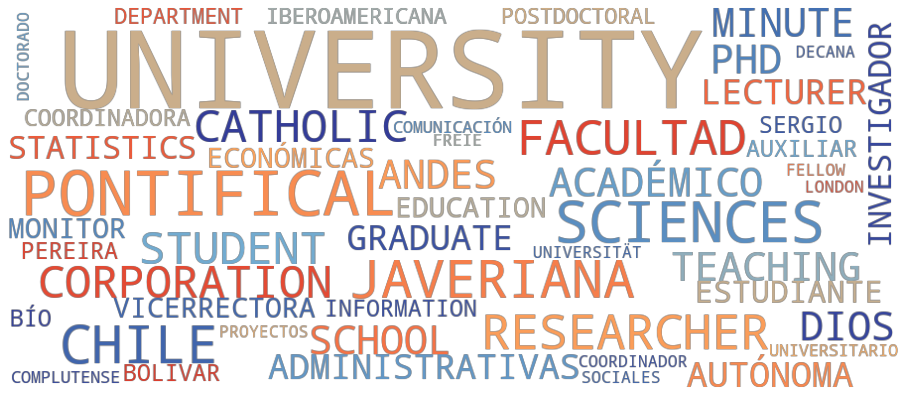

In [139]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,2,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

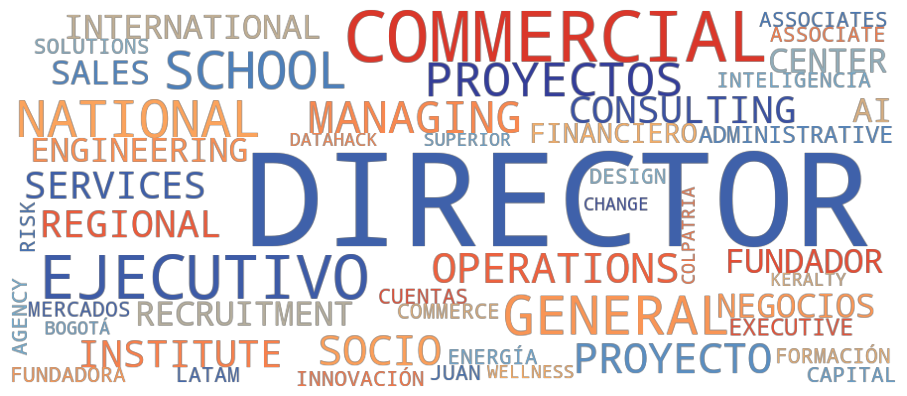

In [140]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,3,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

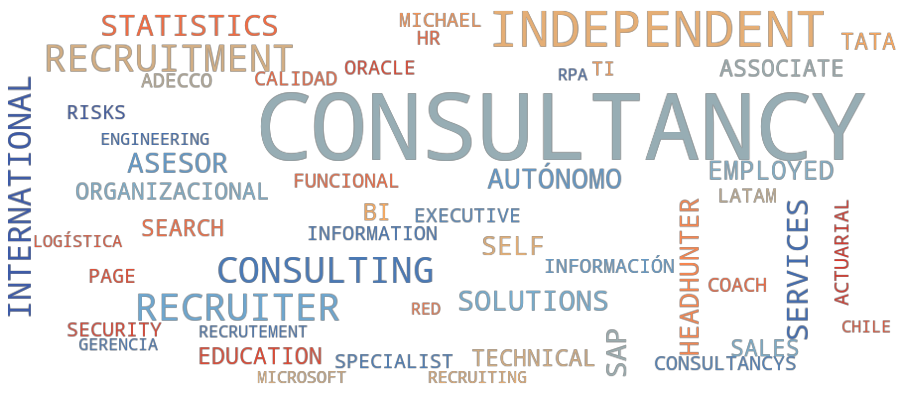

In [141]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,4,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

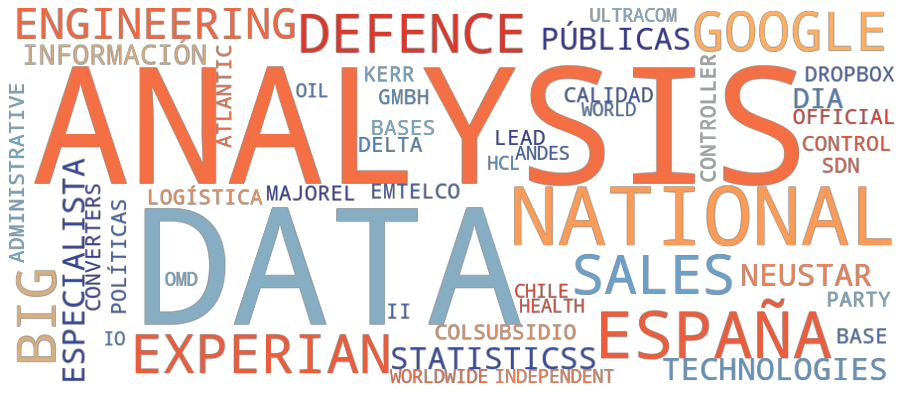

In [143]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,5,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

(-0.5, 899.5, 384.5, -0.5)

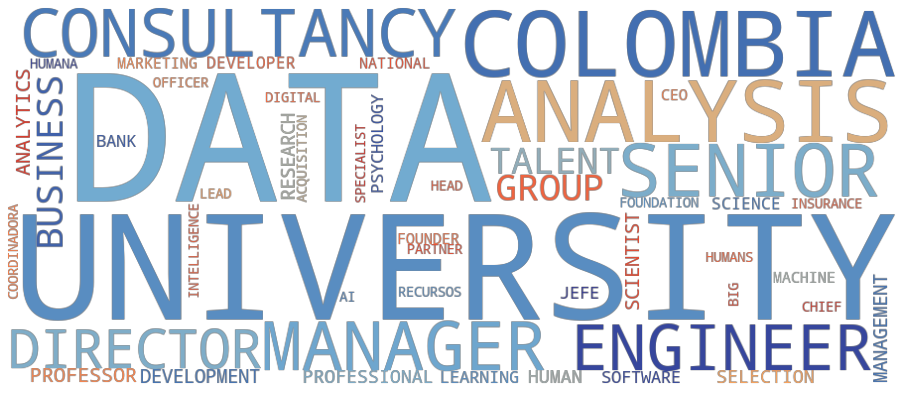

In [142]:
plt.figure(figsize=(16,9))
plt.imshow(wrd_cld_dic_clust(spect_db_labels,-1,50), interpolation='bilinear')
plt.axis("off")
#plt.savefig('wrdcld_1.png')

In [69]:
end_exec=time.time()
print(end_exec-start_exec)

3474.5425930023193


In [0]:
data["dbscan_cluster"]=spect_db_labels
data["dendrogram_cluster"]=clustering_30d_ward.labels_

In [145]:
data[[#"First Name",
      #"Last Name",
      "Position",
      #"Description",
      "dbscan_cluster","dendrogram_cluster"]].sample(25)

,Position,dbscan_cluster,dendrogram_cluster
4246,Jefe Minería de Datos,-1,3
2075,PMO,-1,0
3910,Psicólogo,-1,14
3468,Manager Advanced Business Analytics,-1,12
2863,Directora de Planeación,3,0
3460,CEO,-1,0
6957,Data Science Architect,-1,0
7212,Data Scientist,-1,0
3035,Asistente Comercial,-1,13
4360,Encargado de Organizaciones Sociales Comunitar...,0,0


# Checkpoint (Saving outputs)

In [0]:
data.to_csv(files_route+"data_clusters.csv")

In [0]:
output = open(files_route+'output_files.pkl', 'wb')
pickle.dump([n_grams_counts,#Matriz de ocurrencias
             spect_emb_tfidf_30,#Embedding de clustering (30 dimensiones)
             spect_emb_tfidf_3,# Embedding de visualización (3 dimnensiones)
             clustering_30d_ward,#clustering dendrograma con método Ward
             db_scan# Clustering DbScan
             ], output)# Pickle dictionary using protocol 0.
output.close()

## Load data

In [0]:
data=pd.read_csv(files_route+"data_clusters.csv", index_col=0)

In [0]:
output = open(files_route+'output_files.pkl', 'rb')# Reading mode
n_grams_counts,spect_emb_tfidf_30,spect_emb_tfidf_3,clustering_30d_ward,db_scan= pickle.load(output)
output.close()

In [150]:
pd.crosstab(data.dbscan_cluster, columns="count")

col_0,count
dbscan_cluster,
-1,4558
0,2594
1,175
2,66
3,194
4,202
5,53


In [151]:
data.loc[data.dbscan_cluster==4,['Company','Position','Description']].sample(25)#'First Name','Last Name',

,Company,Position,Description
1853,Freelance Recruiter Ltd,Consultante en recrutement spécialisée IT & D...,consultancy recruiter ltd consultancye en recr...
3794,GRAN EUROPA,Financial Consultant,gran europa financial consultancy
5169,Veta Education Consultancy,Education Counselor,veta education consultancy education counselor
512,PERCEPTIO S.A.S.,Consultor de SAP BI,perceptio s.a.s. consultancy de sap bi
4338,Inove Consultoria Atuarial & Previdenciária,Atuário Sênior,inove consultancy atuarial & previdenciária at...
6722,Agencia consultora Ser Emprender S.A.S.,Coach personal,agency consultancy ser emprender s.a.s. coach...
2454,asesorias hoteleras,chef consultor,asesorias hoteleras chef consultancy
4335,Independiente / Freelance,Consultora de Calidad y Salud,independent / consultancy consultancy de calid...
5372,AppDynamics,Associate Consultant,appdynamics associate consultancy
2902,"AERYS - Aeronaútica, Energías Renovables y Seg...",INGENIERO DE CONSULTORIA,"aerys - aeronaútica, energías renovables y sec..."


In [152]:
pd.crosstab(data.dbscan_cluster[data.Description.str.contains('data scientist', regex=False)],columns='count')

col_0,count
dbscan_cluster,
-1,182
0,314


In [154]:
pd.crosstab(data.dbscan_cluster[data.Description.str.contains('psychology', regex=False)],columns='count')

col_0,count
dbscan_cluster,
-1,184
0,39
1,175
2,1
4,1


In [153]:
data.loc[(data.dbscan_cluster==-1)&(data.Description.str.contains('data scientist', regex=False)),
         ['Company','Position','Description']].sample(25)#'First Name','Last Name',


,Company,Position,Description
261,AXA COLPATRIA,Senior Data Scientist,axa colpatria senior data scientist
4128,XP Inc.,Senior Data Scientist,xp inc. senior data scientist
1320,Allianz Colombia,Profesional Senior - Data Scientist,allianz colombia professional senior - data sc...
4060,ParallelDots,Senior Data Scientist,paralleldots senior data scientist
2765,Intelligence Partner,Senior Data Scientist,intelligence partner senior data scientist
821,Grupo ALTO,Data Scientist,group alto data scientist
7198,Tata Consultancy Services,Senior Data Scientist R&D( Architecting Prod...,tata consultancy services senior data scientis...
3510,Keepler Data Tech,Senior Data Scientist,keepler data tech senior data scientist
3636,PubNative,Senior Data Scientist,pubnative senior data scientist
5790,Fletx,Senior Data Scientist,fletx senior data scientist
